In [ ]:
pip install geopandas matplotlib networkx


In [ ]:
pip install powerlaw

In [ ]:
pip install seaborn


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx

# Load the world map
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Load your datasets
nodes_df = pd.read_csv('Countries - Sheet2.csv')
edges_df = pd.read_csv('MIGRATION_2005_2010.csv')

# Create the graph
G = nx.DiGraph()

# Add nodes with positions
for _, row in nodes_df.iterrows():
    G.add_node(row['Country'], latitude=row['Latitude'], longitude=row['Longitude'])

# Add edges
# for _, row in edges_df.iterrows():
#     country1 = row['Country 1']
#     country2 = row['Country 2']
#     weight=int(row['2005'].replace(',', ''))
#     # weight = int(row['2010'].replace(',', ''))  # Assuming 'Absolute Change' column is of string type and has commas
#     # Check if country1 is not the same as country2
#     if country1 != country2:
#         if weight > 0 and country1 in G.nodes and country2 in G.nodes:
#             G.add_edge(country1, country2, weight=weight)
for _, row in edges_df.iterrows():
    country1 = row['Country 1']
    country2 = row['Country 2']
    weight_value = row['Absolute Change']
    if isinstance(weight_value, str) and weight_value.replace(',', '').isdigit():
        weight = int(weight_value.replace(',', ''))
        # Check if country1 is not the same as country2
        if country1 != country2:
            if weight > 0 and country1 in G.nodes and country2 in G.nodes:
                G.add_edge(country1, country2, weight=weight)
    else:
        print(f"Issue with data in row {_ + 1}: '{weight_value}' is not a valid numeric value.")

# Calculate edge widths proportional to weights
edge_weights = [d['weight'] for u, v, d in G.edges(data=True)]
max_weight = max(edge_weights)
edge_widths = [w / max_weight * 25 for w in edge_weights]  # Adjust multiplier (5) to control edge width scaling
print(edge_widths)

# Calculate node degrees
degrees = dict(G.degree())
in_degrees = dict(G.in_degree())
out_degrees = dict(G.out_degree())







<ipython-input-1-544a12757884>:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


Issue with data in row 1: '-1,152,779' is not a valid numeric value.
Issue with data in row 2: '-7' is not a valid numeric value.
Issue with data in row 5: '-18' is not a valid numeric value.
Issue with data in row 7: '-11' is not a valid numeric value.
Issue with data in row 26: '-564' is not a valid numeric value.
Issue with data in row 31: '-28' is not a valid numeric value.
Issue with data in row 32: '-148' is not a valid numeric value.
Issue with data in row 39: '-7' is not a valid numeric value.
Issue with data in row 44: '-2' is not a valid numeric value.
Issue with data in row 45: '-1,202' is not a valid numeric value.
Issue with data in row 51: '-4' is not a valid numeric value.
Issue with data in row 54: '-3,329' is not a valid numeric value.
Issue with data in row 56: '-349' is not a valid numeric value.
Issue with data in row 64: '-30' is not a valid numeric value.
Issue with data in row 65: '-10' is not a valid numeric value.
Issue with data in row 67: '-463' is not a vali

In [ ]:
import networkx.algorithms.smallworld as smallworld

# Check if the network is a small-world network
is_smallworld = smallworld.is_smallworld(G)

if is_smallworld:
    print("The network is a small-world network.")
else:
    print("The network is not a small-world network.")


AttributeError: module 'networkx.algorithms.smallworld' has no attribute 'is_smallworld'

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import community as community_louvain



# 1. Basic Network Properties
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
avg_degree = sum(dict(G.degree()).values()) / num_nodes
network_density = nx.density(G)

# 2. Centrality Measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

# 3. Community Detection
partition = community_louvain.best_partition(G.to_undirected())

# 4. Robustness and Resilience
# For example, remove the top 10% of nodes by degree and examine the size of the largest connected component
top_nodes_to_remove = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:int(0.1 * num_nodes)]
G_removed = G.copy()
G_removed.remove_nodes_from(top_nodes_to_remove)
largest_cc = max(nx.weakly_connected_components(G_removed), key=len)

# 5. Visualization
pos = nx.spring_layout(G)  # Use spring layout for positioning nodes
node_sizes = [v * 10000 for v in degree_centrality.values()]  # Scale for better visualization
edge_widths = [G[u][v]['weight'] for u, v in G.edges()]
nx.draw_networkx(G, pos, node_size=node_sizes, width=edge_widths, with_labels=True, arrows=True)
plt.show()

# 6. Network Dynamics
# This would depend on having a time series of graphs or edge attributes that change over time.
# Analyze trends, growth, shrinkage, etc.


AttributeError: module 'community' has no attribute 'best_partition'

In [ ]:
assortativity = nx.degree_assortativity_coefficient(G, weight='weight')
print("Assortativity coefficient:", assortativity)


Assortativity coefficient: -0.03445996403583164


In [ ]:
in_degree_assortativity = nx.degree_assortativity_coefficient(G, x='in', y='in')
print(f"In-degree assortativity: {in_degree_assortativity}")

In-degree assortativity: -0.13296888361699505


In [ ]:
out_degree_assortativity = nx.degree_assortativity_coefficient(G, x='out', y='out')
print(f"Out-degree assortativity: {out_degree_assortativity}")

Out-degree assortativity: -0.1696162941290323


In [ ]:
# Calculate incoming population for each country
incoming_population = {}

for country in G.nodes:
    incoming_population[country] = sum(G[edge[0]][edge[1]]['weight'] for edge in G.in_edges(country))

print(incoming_population)


{'Afghanistan': 10821, 'Albania': 0, 'Algeria': 18879, 'American Samoa': 851, 'Andorra': 3676, 'Angola': 10682, 'Anguilla': 511, 'Antigua and Barbuda': 2579, 'Argentina': 255338, 'Armenia': 605, 'Aruba': 3513, 'Australia': 1042189, 'Austria': 153848, 'Azerbaijan': 0, 'Bahamas': 13744, 'Bahrain': 245761, 'Bangladesh': 207955, 'Barbados': 1829, 'Belarus': 0, 'Belgium': 235177, 'Belize': 5072, 'Benin': 43756, 'Bermuda': 1487, 'Bhutan': 7517, 'Bolivia': 16141, 'Bonaire, Sint Eustatius and Saba': 0, 'Bosnia and Herzegovina': 1131, 'Botswana': 27238, 'Brazil': 48230, 'British Virgin Islands': 5791, 'Brunei': 2125, 'Bulgaria': 15285, 'Burkina Faso': 12835, 'Burundi': 58146, 'Cambodia': 0, 'Cameroon': 91019, 'Canada': 881202, 'Cape Verde': 3262, 'Cayman Islands': 5019, 'Central African Republic': 0, 'Chad': 63228, 'Chile': 86046, 'China': 151138, 'Colombia': 22880, 'Comoros': 0, 'Congo': 99716, 'Cook Islands': 225, 'Costa Rica': 77777, "Cote d'Ivoire": 98597, 'Croatia': 51221, 'Cuba': 72, 'Cur

In [ ]:
# Get top 20 countries with highest incoming population
top_20_countries = sorted(incoming_population.items(), key=lambda x: x[1], reverse=True)[:20]

print("Top 20 countries with highest incoming population:")
for country, population in top_20_countries:
    print(country, population)


Top 20 countries with highest incoming population:
United States 5625291
United Arab Emirates 3911017
Spain 2270421
Saudi Arabia 1863764
Italy 1860437
United Kingdom 1281712
Thailand 1045114
Australia 1042189
Germany 969518
Canada 881202
Syria 829595
Pakistan 824710
Qatar 811846
South Africa 673010
France 625140
Jordan 585132
Malaysia 552772
Kuwait 500544
South Korea 414054
Singapore 392815


In [ ]:
print(out_degrees)

{'Afghanistan': 48, 'Albania': 38, 'Algeria': 49, 'American Samoa': 3, 'Andorra': 9, 'Angola': 37, 'Anguilla': 7, 'Antigua and Barbuda': 25, 'Argentina': 53, 'Armenia': 41, 'Aruba': 14, 'Australia': 78, 'Austria': 47, 'Azerbaijan': 32, 'Bahamas': 29, 'Bahrain': 27, 'Bangladesh': 61, 'Barbados': 31, 'Belarus': 37, 'Belgium': 57, 'Belize': 25, 'Benin': 29, 'Bermuda': 18, 'Bhutan': 18, 'Bolivia': 41, 'Bonaire, Sint Eustatius and Saba': 0, 'Bosnia and Herzegovina': 36, 'Botswana': 21, 'Brazil': 65, 'British Virgin Islands': 17, 'Brunei': 14, 'Bulgaria': 50, 'Burkina Faso': 28, 'Burundi': 30, 'Cambodia': 35, 'Cameroon': 46, 'Canada': 86, 'Cape Verde': 25, 'Cayman Islands': 8, 'Central African Republic': 28, 'Chad': 33, 'Chile': 50, 'China': 96, 'Colombia': 56, 'Comoros': 20, 'Congo': 37, 'Cook Islands': 2, 'Costa Rica': 36, "Cote d'Ivoire": 0, 'Croatia': 36, 'Cuba': 58, 'Curacao': 8, 'Cyprus': 36, 'Czechia': 36, 'Democratic Republic of Congo': 50, 'Denmark': 48, 'Djibouti': 16, 'Dominica': 

In [ ]:
# Calculate outgoing population for each country
outgoing_population = {}

for country in G.nodes:
    outgoing_population[country] = sum(G[edge[0]][edge[1]]['weight'] for edge in G.out_edges(country))

print(outgoing_population)


{'Afghanistan': 1158730, 'Albania': 152798, 'Algeria': 60072, 'American Samoa': 324, 'Andorra': 2348, 'Angola': 43939, 'Anguilla': 266, 'Antigua and Barbuda': 5267, 'Argentina': 138177, 'Armenia': 36278, 'Aruba': 4327, 'Australia': 63341, 'Austria': 35960, 'Azerbaijan': 14056, 'Bahamas': 1490, 'Bahrain': 7193, 'Bangladesh': 1273387, 'Barbados': 4135, 'Belarus': 42755, 'Belgium': 47669, 'Belize': 5587, 'Benin': 39101, 'Bermuda': 451, 'Bhutan': 4551, 'Bolivia': 236955, 'Bonaire, Sint Eustatius and Saba': 0, 'Bosnia and Herzegovina': 103868, 'Botswana': 11572, 'Brazil': 309601, 'British Virgin Islands': 1064, 'Brunei': 1697, 'Bulgaria': 202307, 'Burkina Faso': 84567, 'Burundi': 19003, 'Cambodia': 279212, 'Cameroon': 58823, 'Canada': 87653, 'Cape Verde': 12108, 'Cayman Islands': 126, 'Central African Republic': 119623, 'Chad': 15948, 'Chile': 44127, 'China': 1465481, 'Colombia': 672305, 'Comoros': 12982, 'Congo': 23893, 'Cook Islands': 1172, 'Costa Rica': 15938, "Cote d'Ivoire": 0, 'Croati

In [ ]:
# Get top 20 countries with highest incoming population
top_20_countries = sorted(outgoing_population.items(), key=lambda x: x[1], reverse=True)[:20]

print("Top 20 countries with highest outgoing population:")
for country, population in top_20_countries:
    print(country, population)

Top 20 countries with highest outgoing population:
India 3761830
Mexico 1599452
China 1465481
Bangladesh 1273387
Romania 1273314
Iraq 1241329
Pakistan 1188255
Afghanistan 1158730
Philippines 1066272
Poland 869335
Egypt 807050
Caribbean 789397
Myanmar 755798
Colombia 672305
Indonesia 667766
Somalia 537932
United States 432993
Nepal 425869
United Kingdom 408737
Morocco 396374


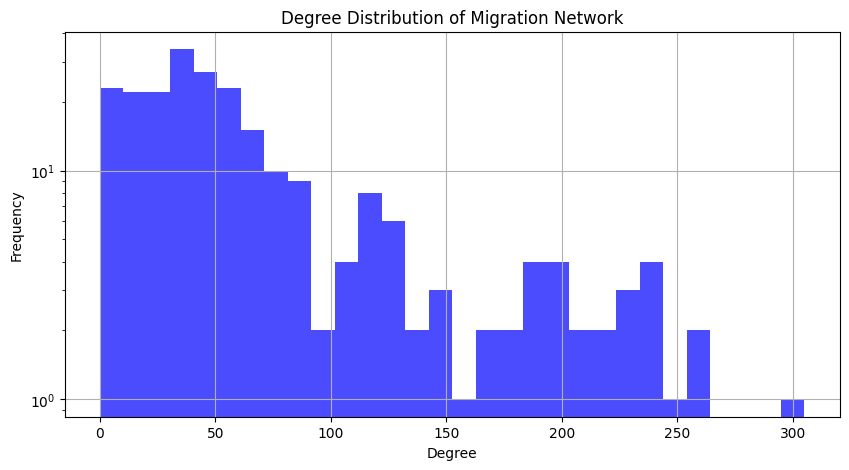

In [ ]:
import numpy as np

# Get degrees of all nodes
node_degrees = [deg for node, deg in G.degree()]

# Plotting the degree distribution
plt.figure(figsize=(10, 5))
plt.hist(node_degrees, bins=30, color='blue', alpha=0.7)  # You can adjust the number of bins
plt.title("Degree Distribution of Migration Network")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.yscale('log')  # Log scale may be appropriate if the distribution is heavy-tailed
plt.grid(True)
plt.show()


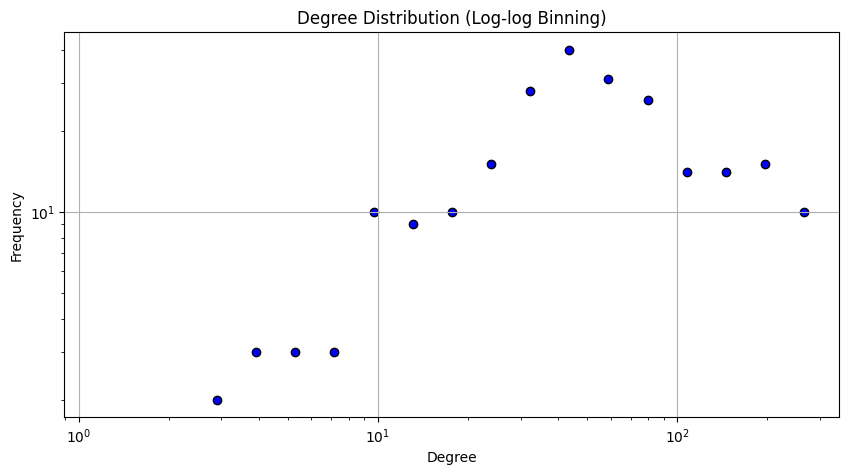

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx

# Assuming 'G' is your already constructed network graph

# Get the degree sequences
node_degrees = [deg for node, deg in G.degree()]

# Calculate the histograms with log-spaced bins
bins = np.logspace(np.log10(1), np.log10(max(node_degrees)), num=20)  # Adjust bin count as necessary
degree_hist, degree_bins = np.histogram(node_degrees, bins=bins)

# Bin centers
degree_bin_centers = 0.5 * (degree_bins[:-1] + degree_bins[1:])

# Create scatter plot
plt.figure(figsize=(10, 5))
plt.scatter(degree_bin_centers, degree_hist, color='blue', edgecolor='black')
plt.xscale('log')
plt.yscale('log')
plt.title('Degree Distribution (Log-log Binning)')
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


In [ ]:
import powerlaw

# Fit the degrees to a power-law distribution
results = powerlaw.Fit(node_degrees)
print("Alpha (scale parameter) of the fitted power law:", results.power_law.alpha)
print("xmin of the fitted power law:", results.power_law.xmin)

# Compare with exponential distribution
R, p = results.distribution_compare('power_law', 'exponential')
print("Loglikelihood ratio between power law and exponential distribution:", R)
print("P-value of the test:", p)


Values less than or equal to 0 in data. Throwing out 0 or negative values


Calculating best minimal value for power law fit
Alpha (scale parameter) of the fitted power law: 2.3153500351366016
xmin of the fitted power law: 38.0
Loglikelihood ratio between power law and exponential distribution: -6.337908162065679
P-value of the test: 0.19955652103576738


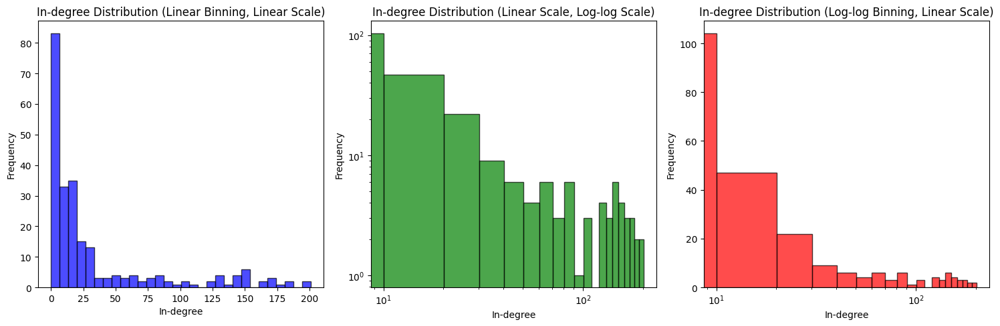

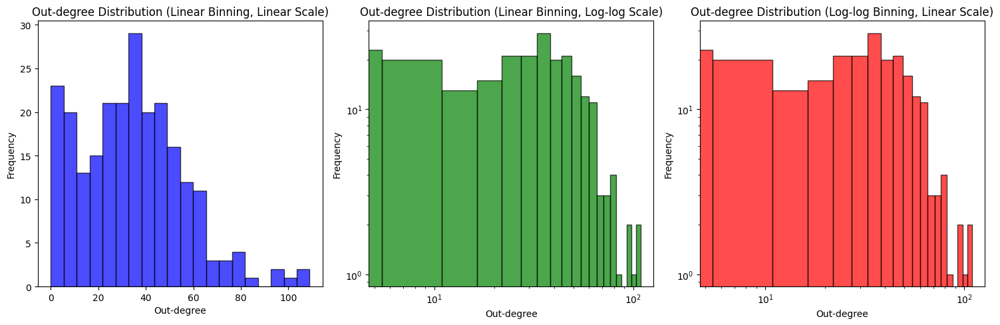

In [ ]:
# Calculate in-degree distribution
in_degree_val = [degree for node, degree in G.in_degree()]
# Calculate out-degree distribution
out_degree_val = [degree for node, degree in G.out_degree()]

# Linear binning with linear scale for in-degree
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(in_degree_val, bins=30, alpha=0.7, color='blue', edgecolor='black')
plt.title('In-degree Distribution (Linear Binning, Linear Scale)')
plt.xlabel('In-degree')
plt.ylabel('Frequency')
# Log-log scale for in-degree
plt.subplot(1, 3, 2)
plt.hist(in_degree_val, bins=20, alpha=0.7, color='green', edgecolor='black')
plt.xscale('log')
plt.yscale('log')
plt.title('In-degree Distribution (Linear Scale, Log-log Scale)')
plt.xlabel('In-degree')
plt.ylabel('Frequency')
# Log-log binning with linear scale for in-degree
log_bins_in = 20
plt.subplot(1, 3, 3)
plt.hist(in_degree_val, bins=log_bins_in, alpha=0.7, color='red',edgecolor='black')
plt.xscale('log')
plt.title('In-degree Distribution (Log-log Binning, Linear Scale)')
plt.xlabel('In-degree')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
# Linear binning with linear scale for out-degree
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(out_degree_val, bins=20, alpha=0.7, color='blue', edgecolor='black')
plt.title('Out-degree Distribution (Linear Binning, Linear Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Frequency')
# Log-log scale for out-degree
plt.subplot(1, 3, 2)
plt.hist(out_degree_val, bins=20, alpha=0.7, color='green', edgecolor='black')
plt.xscale('log')
plt.yscale('log')
plt.title('Out-degree Distribution (Linear Binning, Log-log Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Frequency')

# Log-log binning with linear scale for out-degree
plt.subplot(1,3,3)
log_bins_out = 20
plt.hist(out_degree_val, bins=log_bins_out, alpha=0.7, color='red',edgecolor='black')
plt.xscale('log')
plt.yscale('log')
plt.title('Out-degree Distribution (Log-log Binning, Linear Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

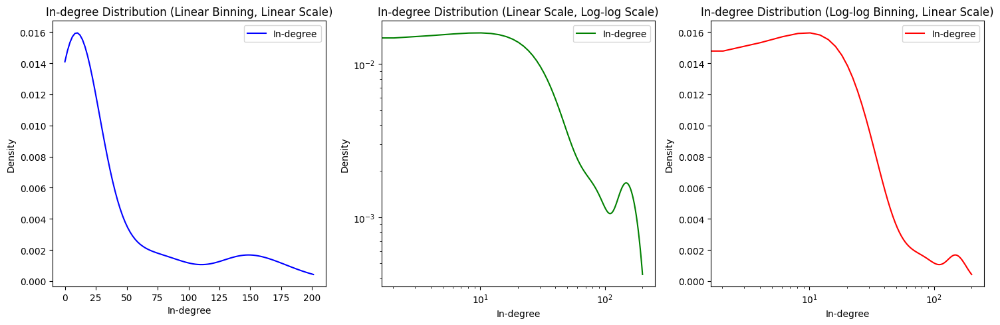

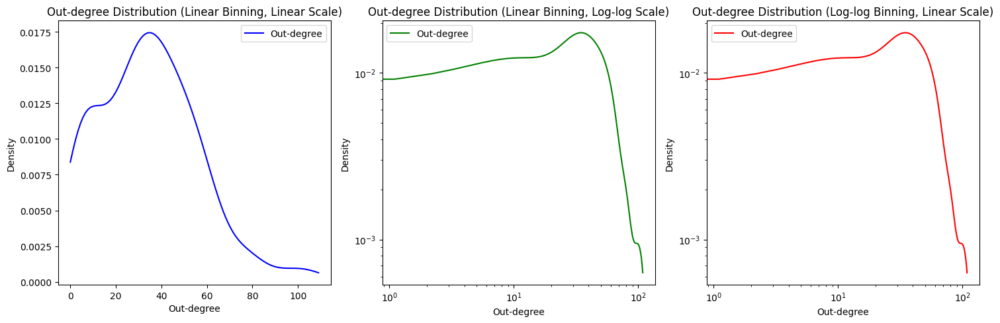

In [ ]:
from scipy.stats import gaussian_kde

# Function to plot smooth curve
def plot_smooth_curve(data, color, label):
    kde = gaussian_kde(data)
    x_vals = np.linspace(min(data), max(data), 100)
    plt.plot(x_vals, kde(x_vals), color=color, label=label)

# Linear binning with linear scale for in-degree
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plot_smooth_curve(in_degree_val, 'blue', 'In-degree')
plt.title('In-degree Distribution (Linear Binning, Linear Scale)')
plt.xlabel('In-degree')
plt.ylabel('Density')
plt.legend()
# Log-log scale for in-degree
plt.subplot(1, 3, 2)
plot_smooth_curve(in_degree_val, 'green', 'In-degree')
plt.xscale('log')
plt.yscale('log')
plt.title('In-degree Distribution (Linear Scale, Log-log Scale)')
plt.xlabel('In-degree')
plt.ylabel('Density')
plt.legend()
# Log-log binning with linear scale for in-degree
plt.subplot(1, 3, 3)
plot_smooth_curve(in_degree_val, 'red', 'In-degree')
plt.xscale('log')
plt.title('In-degree Distribution (Log-log Binning, Linear Scale)')
plt.xlabel('In-degree')
plt.ylabel('Density')
plt.legend()
plt.tight_layout()
plt.show()

# Linear binning with linear scale for out-degree
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plot_smooth_curve(out_degree_val, 'blue', 'Out-degree')
plt.title('Out-degree Distribution (Linear Binning, Linear Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Density')
plt.legend()
# Log-log scale for out-degree
plt.subplot(1, 3, 2)
plot_smooth_curve(out_degree_val, 'green', 'Out-degree')
plt.xscale('log')
plt.yscale('log')
plt.title('Out-degree Distribution (Linear Binning, Log-log Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Density')
plt.legend()
# Log-log binning with linear scale for out-degree
plt.subplot(1,3,3)
plot_smooth_curve(out_degree_val, 'red', 'Out-degree')
plt.xscale('log')
plt.yscale('log')
plt.title('Out-degree Distribution (Log-log Binning, Linear Scale)')
plt.xlabel('Out-degree')
plt.ylabel('Density')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
from scipy.stats import kstest, poisson
import numpy as np
# Assuming lambda is the average degree
lambda_in = np.mean(in_degree_val)
lambda_out = np.mean(out_degree_val)
# Perform K-S test for in-degree
ks_stat_in, p_value_in = kstest(in_degree_val, 'poisson', args=(lambda_in,))
print(f'In-Degree Poisson K-S Test: KS Statistic={ks_stat_in}, p-value={p_value_in}')
if p_value_in > 0.05:
  print("Interpretation: The in-degree distribution fits well with a Poisson distribution.")


else:
  print("Interpretation: The in-degree distribution does not fit well with a Poisson distribution.")

# Perform K-S test for out-degree
ks_stat_out, p_value_out = kstest(out_degree_val, 'poisson', args=(lambda_out,))
print(f'Out-Degree Poisson K-S Test: KS Statistic={ks_stat_out},p-value={p_value_out}')
if p_value_out > 0.05:
  print("Interpretation: The out-degree distribution fits well with a Poisson distribution.")

else:
  print("Interpretation: The out-degree distribution does not fit well with a Poisson distribution.")


In-Degree Poisson K-S Test: KS Statistic=0.6494411834701898, p-value=1.4339117773713156e-98
Interpretation: The in-degree distribution does not fit well with a Poisson distribution.
Out-Degree Poisson K-S Test: KS Statistic=0.29600540766875194,p-value=5.591890933336167e-19
Interpretation: The out-degree distribution does not fit well with a Poisson distribution.


In [ ]:
import powerlaw
# Fit and analyze the in-degree distribution
fit_in = powerlaw.Fit(in_degree_val)
R, p = fit_in.distribution_compare('power_law', 'exponential')
print(f"In-Degree Power-Law Fit: Alpha={fit_in.alpha}, Sigma={fit_in.sigma}")
print(f"Likelihood Ratio: {R}, p-value={p}")
if p > 0.05:
  print("Interpretation: The in-degree distribution fits a Power-Law distribution better or as well as an exponential distribution.")


else:
  print("Interpretation: There is not enough evidence to suggest the in-degree distribution fits a Power-Law distribution better than an exponential distribution.")

# Fit and analyze the out-degree distribution
fit_out = powerlaw.Fit(out_degree_val)
R, p = fit_out.distribution_compare('power_law', 'exponential')
print(f"Out-Degree Power-Law Fit: Alpha={fit_out.alpha}, Sigma={fit_out.sigma}")
print(f"Likelihood Ratio: {R}, p-value={p}")
if p > 0.05:
  print("Interpretation: The out-degree distribution fits a Power-Law distribution better or as well as an exponential distribution.")

else:
  print("Interpretation: There is not enough evidence to suggest the out-degree distribution fits a Power-Law distribution better than an exponential distribution.")


Calculating best minimal value for power law fit
In-Degree Power-Law Fit: Alpha=1.8190962077698771, Sigma=0.07239856036978316
Likelihood Ratio: -2.9787137935166355, p-value=0.6761614655319255
Interpretation: The in-degree distribution fits a Power-Law distribution better or as well as an exponential distribution.
Calculating best minimal value for power law fit
Out-Degree Power-Law Fit: Alpha=5.380236072070375, Sigma=0.5906309114692757
Likelihood Ratio: -0.4080487519862599, p-value=0.6794705332192945
Interpretation: The out-degree distribution fits a Power-Law distribution better or as well as an exponential distribution.


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


In [ ]:
from scipy.stats import expon, kstest
import numpy as np
# Fit parameters for the exponential distribution
# The scale parameter (beta) is the inverse of the mean of the data
# Scale parameter estimation (mean of the data)
scale_in = np.mean(in_degree_val)
scale_out = np.mean(out_degree_val)
# Since exponential distribution is scale-dependent, we directly use the scale parameter.



# No additional data normalization (like Z-score) is necessary here, as we're fitting the scale parameter directly.

# Perform K-S test for in-degree against an exponential distribution
ks_stat_in, p_value_in = kstest(in_degree_val, 'expon', args=(0, scale_in))
print(f'In-Degree Exponential K-S Test: KS Statistic={ks_stat_in}, p-value={p_value_in}')
if p_value_in > 0.05:
  print("Interpretation: The in-degree distribution fits well with an exponential distribution.")

else:
  print("Interpretation: The in-degree distribution does not fit well with an exponential distribution.")

# Perform K-S test for out-degree against an exponential distribution
ks_stat_out, p_value_out = kstest(out_degree_val, 'expon', args=(0, scale_out))
print(f'Out-Degree Exponential K-S Test: KS Statistic={ks_stat_out}, p-value={p_value_out}')
if p_value_out > 0.05:
  print("Interpretation: The out-degree distribution fits well with an exponential distribution.")

else:
  print("Interpretation: The out-degree distribution does not fit well with an exponential distribution.")


In-Degree Exponential K-S Test: KS Statistic=0.19264844076832077, p-value=3.2744759868317316e-08
Interpretation: The in-degree distribution does not fit well with an exponential distribution.
Out-Degree Exponential K-S Test: KS Statistic=0.18811830314796674, p-value=7.562264931521767e-08
Interpretation: The out-degree distribution does not fit well with an exponential distribution.


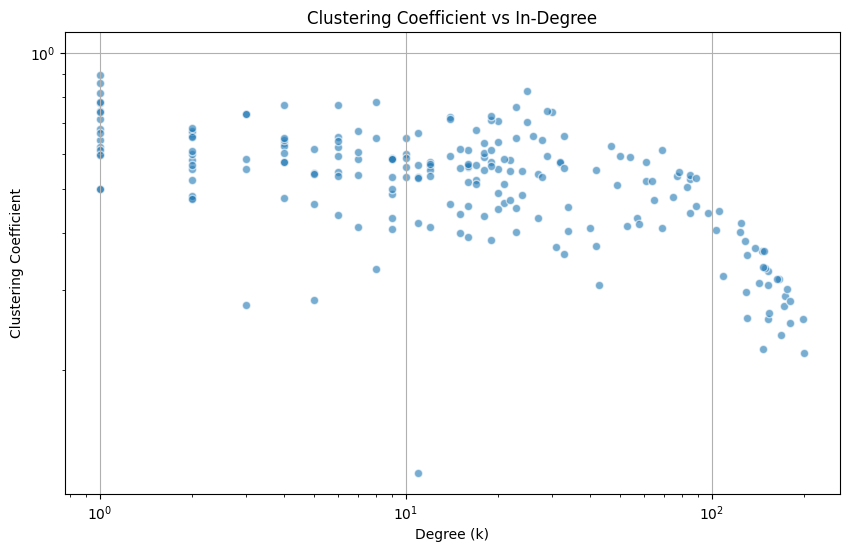

Average Clustering Coefficient: 0.53
Interpretation: Typically, a high clustering coefficient at lower degrees suggests that low-degree nodes form tight-knit clusters. Conversely, a lower clustering coefficient at higher degrees might indicate that high-degree nodes connect more broadly but less densely.


In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# Calculate the clustering coefficient for each node
clustering_coeffs = nx.clustering(G)

# Get the degree of each node
in_degrees = dict(G.in_degree())

# Prepare data for plotting
degree_values = list(in_degrees.values())
clustering_values = list(clustering_coeffs.values())

# Create a scatter plot of clustering coefficient vs degree
plt.figure(figsize=(10, 6))
plt.scatter(degree_values, clustering_values, alpha=0.6, edgecolors='w')
plt.title('Clustering Coefficient vs In-Degree')
plt.xlabel('Degree (k)')
plt.ylabel('Clustering Coefficient')
plt.xscale('log')  # Use logarithmic scale if the range of degrees is large
plt.yscale('log')  # Use logarithmic scale to see patterns more clearly if necessary
plt.grid(True)
plt.show()

# Interpretation
if not clustering_values:  # Check if list is empty
    print("No data to plot.")
else:
    avg_clustering = sum(clustering_values) / len(clustering_values)
    print(f"Average Clustering Coefficient: {avg_clustering:.2f}")
    print("Interpretation: Typically, a high clustering coefficient at lower degrees suggests that low-degree nodes form tight-knit clusters. Conversely, a lower clustering coefficient at higher degrees might indicate that high-degree nodes connect more broadly but less densely.")


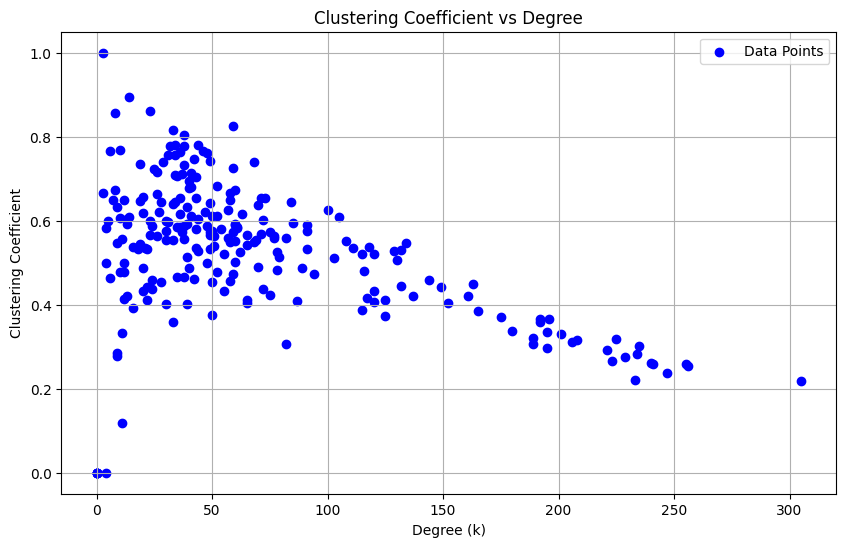

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Calculate clustering coefficient for each node
clustering_coefficient = nx.clustering(G)
# Calculate degree of each node
degree = dict(G.degree())
# Preparing data for plotting
k_vals = list(degree.values())
cc_vals = list(clustering_coefficient.values())
# Sorting data points by degree
sorted_indices = np.argsort(k_vals)
sorted_k_vals = np.array(k_vals)[sorted_indices]
sorted_cc_vals = np.array(cc_vals)[sorted_indices]
# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(k_vals, cc_vals, color='blue', label='Data Points')

plt.title('Clustering Coefficient vs Degree')
plt.xlabel('Degree (k)')
plt.ylabel('Clustering Coefficient')
# plt.xscale('log')
# plt.yscale('log')
plt.grid(True)
plt.legend()
plt.show()

In [ ]:
import networkx as nx

# Calculate largest connected component
largest_cc = max(nx.strongly_connected_components(G), key=len)
G_largest_cc = G.subgraph(largest_cc)
# Calculate average clustering coefficient and average shortest path length
avg_clustering_coefficient = nx.average_clustering(G_largest_cc)
avg_shortest_path_length = nx.average_shortest_path_length(G_largest_cc)
# Generate random graph with the same number of nodes and edge probability as the largest connected component
# random_graph = nx.gnm_random_graph(len(G_largest_cc.nodes()),len(G_largest_cc.edges()))
random_graph = nx.gnm_random_graph(G.number_of_nodes(), G.number_of_edges(), directed=True)
# Calculate average clustering coefficient and average shortest path length for random graph
avg_clustering_coefficient_random = nx.average_clustering(random_graph)
avg_shortest_path_length_random = nx.average_shortest_path_length(random_graph)
# Print the results
print("Average Clustering Coefficient:", avg_clustering_coefficient)
print("Average Shortest Path Length:", avg_shortest_path_length)
print("Average Clustering Coefficient (Random Graph):", avg_clustering_coefficient_random)
print("Average Shortest Path Length (Random Graph):", avg_shortest_path_length_random)
# Determine if the network exhibits small-world or ultra-small-world␣ characteristics
if avg_clustering_coefficient > avg_clustering_coefficient_random and avg_shortest_path_length < avg_shortest_path_length_random:
  print("The network exhibits small-world characteristics.")

elif avg_clustering_coefficient > avg_clustering_coefficient_random and avg_shortest_path_length < avg_shortest_path_length_random:
  print("The network exhibits ultra-small-world characteristics.")

else:
  print("The network does not exhibit small-world or ultra-small-world characteristics.")

Average Clustering Coefficient: 0.5509136029133165
Average Shortest Path Length: 2.1056940017386263
Average Clustering Coefficient (Random Graph): 0.1449165738817363
Average Shortest Path Length (Random Graph): 1.8611140658795164
The network does not exhibit small-world or ultra-small-world characteristics.


In [ ]:
import networkx as nx
import numpy as np

# Calculate the average clustering coefficient for the original network
avg_clustering = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {avg_clustering}")

# Try to calculate the average shortest path length if the graph is connected
try:
    avg_path_length = nx.average_shortest_path_length(G)
    print(f"Average Shortest Path Length: {avg_path_length}")
except nx.NetworkXError:
    print("Graph is not strongly connected; finding largest strongly connected component for path length.")
    largest_scc = max(nx.strongly_connected_components(G), key=len)
    subgraph = G.subgraph(largest_scc)
    avg_path_length = nx.average_shortest_path_length(subgraph)
    print(f"Average Shortest Path Length (in largest SCC): {avg_path_length}")

# Generate a random graph with the same number of nodes and edges
random_graph = nx.gnm_random_graph(G.number_of_nodes(), G.number_of_edges(), directed=True)

# Calculate metrics for the random graph
random_avg_clustering = nx.average_clustering(random_graph)
random_avg_path_length = nx.average_shortest_path_length(random_graph) if nx.is_weakly_connected(random_graph) else np.inf
print(f"Random Graph Average Clustering Coefficient: {random_avg_clustering}")
print(f"Random Graph Average Shortest Path Length: {random_avg_path_length}")

# Compare the metrics
print("\nComparison:")
print(f"Original / Random Clustering Coefficient Ratio: {avg_clustering / random_avg_clustering:.2f}")
print(f"Original / Random Path Length Ratio: {avg_path_length / random_avg_path_length:.2f}")

# Determine if the network exhibits small-world characteristics
if (avg_clustering / random_avg_clustering > 1) and (avg_path_length / random_avg_path_length <= 1):
    print("The network exhibits small-world characteristics.")
else:
    print("The network does not exhibit small-world characteristics.")


Average Clustering Coefficient: 0.5273719429397339
Graph is not strongly connected; finding largest strongly connected component for path length.
Average Shortest Path Length (in largest SCC): 2.1056940017386263
Random Graph Average Clustering Coefficient: 0.14378090269150984
Random Graph Average Shortest Path Length: 1.8606708506187286

Comparison:
Original / Random Clustering Coefficient Ratio: 3.67
Original / Random Path Length Ratio: 1.13
The network does not exhibit small-world characteristics.


In [ ]:
import networkx as nx
import pandas as pd

# Calculate centralities
betweenness_centrality = nx.betweenness_centrality(G)
degree_centrality = nx.degree_centrality(G)
closeness_centrality = nx.closeness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality_numpy(G)  # Using the numpy version for potentially large graph

# Convert to pandas DataFrame for easy sorting and manipulation
centrality_df = pd.DataFrame({
    'Country': list(G.nodes()),
    'Betweenness Centrality': [betweenness_centrality[node] for node in G.nodes()],
    'Degree Centrality': [degree_centrality[node] for node in G.nodes()],
    'Closeness Centrality': [closeness_centrality[node] for node in G.nodes()],
    'Eigenvector Centrality': [eigenvector_centrality[node] for node in G.nodes()]
})

# Sort by each centrality and take the top 20
top_20_betweenness = centrality_df.sort_values(by='Betweenness Centrality', ascending=False).head(20)
top_20_degree = centrality_df.sort_values(by='Degree Centrality', ascending=False).head(20)
top_20_closeness = centrality_df.sort_values(by='Closeness Centrality', ascending=False).head(20)
top_20_eigenvector = centrality_df.sort_values(by='Eigenvector Centrality', ascending=False).head(20)

# Print results
print("Top 20 Countries by Betweenness Centrality:")
print(top_20_betweenness)
print("\nTop 20 Countries by Degree Centrality:")
print(top_20_degree)
print("\nTop 20 Countries by Closeness Centrality:")
print(top_20_closeness)
print("\nTop 20 Countries by Eigenvector Centrality:")
print(top_20_eigenvector)


Top 20 Countries by Betweenness Centrality:
                          Country  Betweenness Centrality  Degree Centrality  \
215                United Kingdom                0.084444           1.286920   
70                         France                0.070969           1.075949   
11                      Australia                0.051561           1.042194   
216                 United States                0.047451           1.012658   
100                         Italy                0.035275           1.080169   
36                         Canada                0.034036           0.983122   
143                   Netherlands                0.028916           0.940928   
190                  South Africa                0.027683           0.869198   
60                          Egypt                0.027532           0.810127   
19                        Belgium                0.027037           0.966245   
194                     Sri Lanka                0.021602           0.434599

<ipython-input-3-fc827a5aba84>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('plasma', max(degrees.values()) + 1)


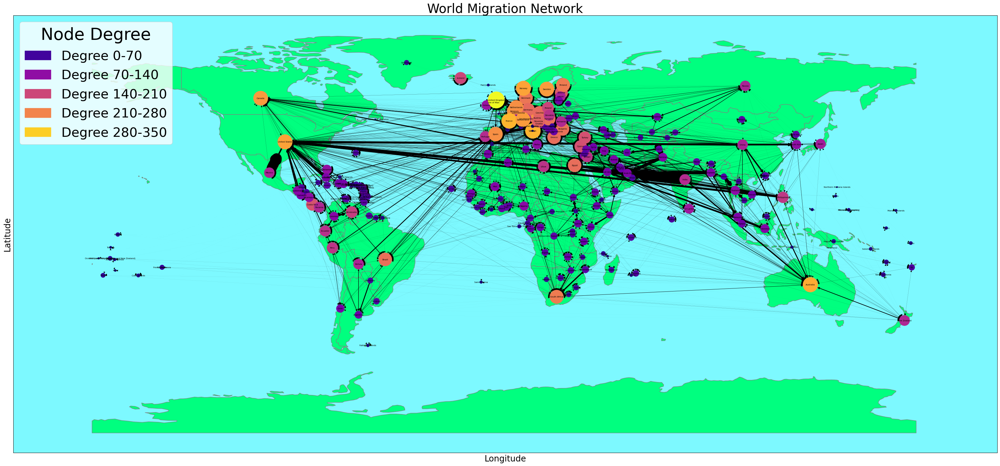

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import Patch
import matplotlib.patches as mpatches

# Assuming loading datasets and creating the graph is the same...

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(42, 48))

# Set the background color for the axes (oceans and seas)
ax.set_facecolor('#7DF9FF')

# Plot the world map with light green for land
world.plot(ax=ax, color='#00FF7F', edgecolor='gray')

# Define color map for nodes based on degrees
color_map = plt.cm.get_cmap('plasma', max(degrees.values()) + 1)

# Draw the network
pos = {node: (data['longitude'], data['latitude']) for node, data in G.nodes(data=True)}
node_size = [degrees[node] * 5 for node in G.nodes()]
node_colors = [color_map(degrees[node]) for node in G.nodes()]

nx.draw_networkx(G, pos=pos, ax=ax, node_size=node_size, node_color=node_colors,
                 width=edge_widths, edge_color='black', arrows=True, font_size=5)


degree_ranges = [0, 70, 140, 210, 280, 350]
# Calculate the positions in the colormap for each range midpoint
color_positions = [((start + end) / 2) / 350 for start, end in zip(degree_ranges[:-1], degree_ranges[1:])]
colors = [color_map(pos) for pos in color_positions]

# Creating legend handles manually for each degree range
legend_handles = [mpatches.Patch(color=colors[i], label=f'Degree {degree_ranges[i]}-{degree_ranges[i+1]}') for i in range(len(degree_ranges)-1)]

# Displaying the legend
plt.legend(handles=legend_handles, title='Node Degree', fontsize=31, title_fontsize=40, loc='upper left')

plt.title('World Migration Network', fontsize=30)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

<ipython-input-9-2817aa112835>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('plasma', max(in_degrees.values()) + 1)


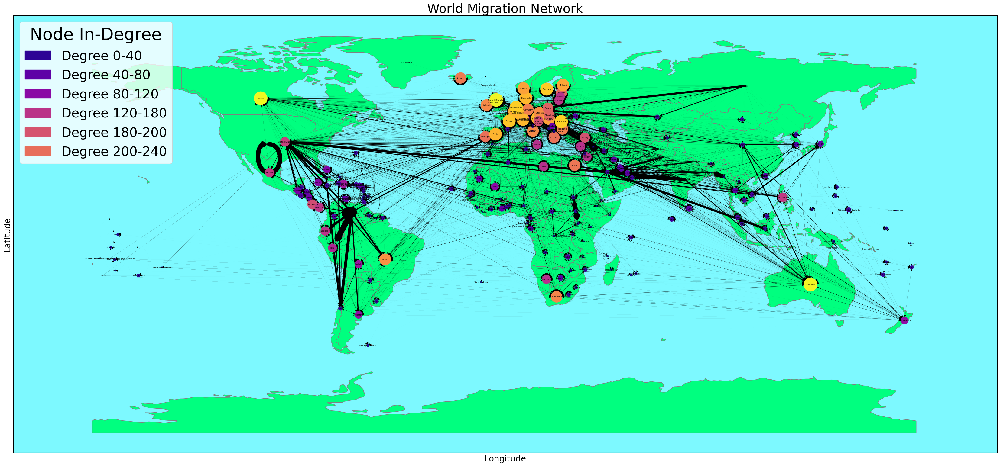

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import Patch
import matplotlib.patches as mpatches

# Assuming loading datasets and creating the graph is the same...

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(42, 48))

# Set the background color for the axes (oceans and seas)
ax.set_facecolor('#7DF9FF')

# Plot the world map with light green for land
world.plot(ax=ax, color='#00FF7F', edgecolor='gray')

# Define color map for nodes based on degrees
color_map = plt.cm.get_cmap('plasma', max(degrees.values()) + 1)

# Draw the network
pos = {node: (data['longitude'], data['latitude']) for node, data in G.nodes(data=True)}
node_size = [in_degrees[node] * 5 for node in G.nodes()]
node_colors = [color_map(in_degrees[node]) for node in G.nodes()]

nx.draw_networkx(G, pos=pos, ax=ax, node_size=node_size, node_color=node_colors,
                 width=edge_widths, edge_color='black', arrows=True, font_size=5)


degree_ranges = [0, 40, 80, 120, 180, 200, 240]
# Calculate the positions in the colormap for each range midpoint
color_positions = [((start + end) / 2) / 350 for start, end in zip(degree_ranges[:-1], degree_ranges[1:])]
colors = [color_map(pos) for pos in color_positions]

# Creating legend handles manually for each degree range
legend_handles = [mpatches.Patch(color=colors[i], label=f'Degree {degree_ranges[i]}-{degree_ranges[i+1]}') for i in range(len(degree_ranges)-1)]

# Displaying the legend
plt.legend(handles=legend_handles, title='Node In-Degree', fontsize=31, title_fontsize=40, loc='upper left')

plt.title('World Migration Network', fontsize=30)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

<ipython-input-6-da879a7fa370>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('plasma', max(degrees.values()) + 1)


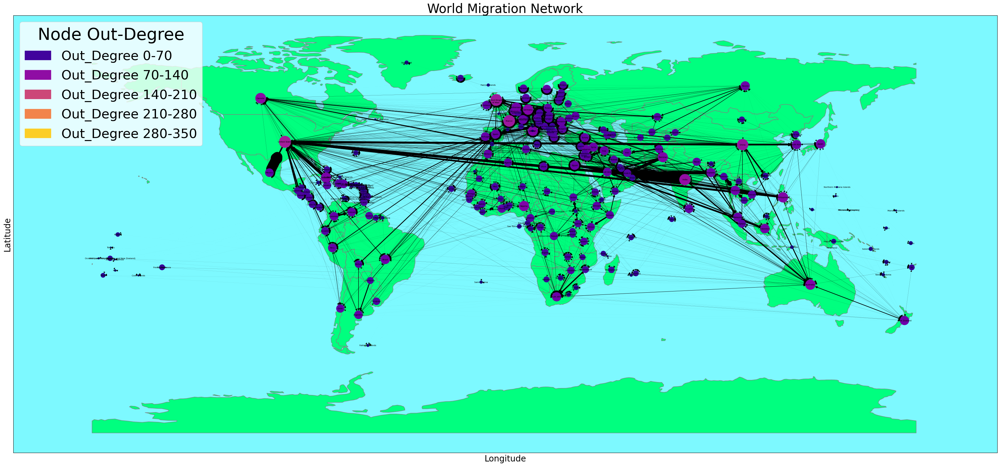

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import Patch
import matplotlib.patches as mpatches

# Assuming loading datasets and creating the graph is the same...

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(42, 48))

# Set the background color for the axes (oceans and seas)
ax.set_facecolor('#7DF9FF')

# Plot the world map with light green for land
world.plot(ax=ax, color='#00FF7F', edgecolor='gray')

# Define color map for nodes based on degrees
color_map = plt.cm.get_cmap('plasma', max(degrees.values()) + 1)

# Draw the network
pos = {node: (data['longitude'], data['latitude']) for node, data in G.nodes(data=True)}
node_size = [out_degrees[node] *7 for node in G.nodes()]
node_colors = [color_map(out_degrees[node]) for node in G.nodes()]

nx.draw_networkx(G, pos=pos, ax=ax, node_size=node_size, node_color=node_colors,
                 width=edge_widths, edge_color='black', arrows=True, font_size=5)


degree_ranges = [0, 70, 140, 210, 280, 350]
# Calculate the positions in the colormap for each range midpoint
color_positions = [((start + end) / 2) / 350 for start, end in zip(degree_ranges[:-1], degree_ranges[1:])]
colors = [color_map(pos) for pos in color_positions]

# Creating legend handles manually for each degree range
legend_handles = [mpatches.Patch(color=colors[i], label=f'Out_Degree {degree_ranges[i]}-{degree_ranges[i+1]}') for i in range(len(degree_ranges)-1)]

# Displaying the legend
plt.legend(handles=legend_handles, title='Node Out-Degree', fontsize=31, title_fontsize=40, loc='upper left')

plt.title('World Migration Network', fontsize=30)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

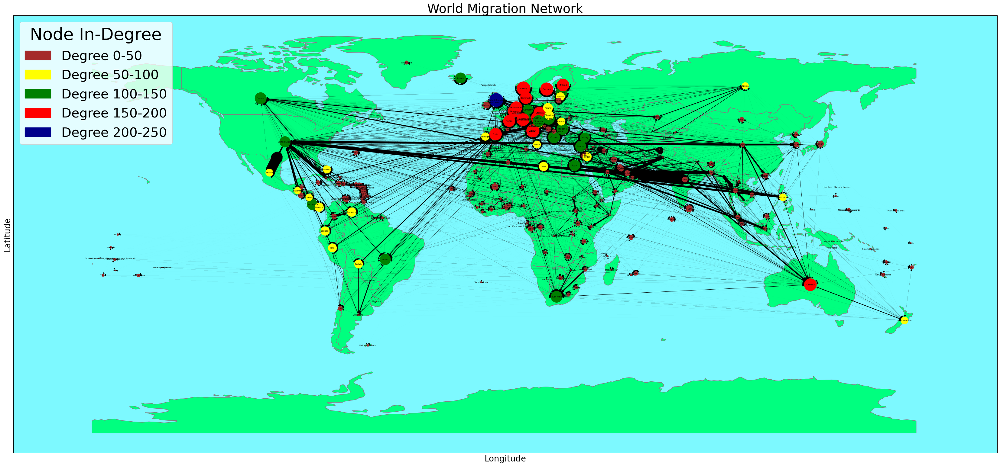

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import Patch
import matplotlib.patches as mpatches

# Assuming loading datasets and creating the graph is the same...

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(42, 48))

# Set the background color for the axes (oceans and seas)
ax.set_facecolor('#7DF9FF')

# Plot the world map with light green for land
world.plot(ax=ax, color='#00FF7F', edgecolor='gray')

# Define custom color map for nodes based on degrees
custom_color_map = {
    (0, 50): 'brown',
    (50, 100): 'yellow',
    (100, 150): 'green',
    (150, 200): 'red',
    (200, 250): 'darkblue'
}

# Map in-degree values to colors based on custom color map
node_colors = []
for node in G.nodes():
    in_degree = in_degrees[node]
    for degree_range, color in custom_color_map.items():
        if degree_range[0] <= in_degree < degree_range[1]:
            node_colors.append(color)
            break

# Draw the network
pos = {node: (data['longitude'], data['latitude']) for node, data in G.nodes(data=True)}
node_size = [in_degrees[node] * 5 for node in G.nodes()]

nx.draw_networkx(G, pos=pos, ax=ax, node_size=node_size, node_color=node_colors,
                 width=edge_widths, edge_color='black', arrows=True, font_size=5)

# Create legend handles manually for each degree range
legend_handles = [mpatches.Patch(color=color, label=f'Degree {degree_range[0]}-{degree_range[1]}') for degree_range, color in custom_color_map.items()]

# Display the legend
plt.legend(handles=legend_handles, title='Node In-Degree', fontsize=31, title_fontsize=40, loc='upper left')

plt.title('World Migration Network', fontsize=30)
plt.xlabel('Longitude', fontsize=20)
plt.ylabel('Latitude', fontsize=20)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()



Centrality measures:
Degree Centrality: {'Afghanistan': 0.20675105485232065, 'Albania': 0.16033755274261602, 'Algeria': 0.2911392405063291, 'American Samoa': 0.03797468354430379, 'Andorra': 0.08016877637130801, 'Angola': 0.19831223628691982, 'Anguilla': 0.06751054852320675, 'Antigua and Barbuda': 0.2742616033755274, 'Argentina': 0.2531645569620253, 'Armenia': 0.1772151898734177, 'Aruba': 0.10970464135021096, 'Australia': 1.0421940928270041, 'Austria': 0.9324894514767932, 'Azerbaijan': 0.13080168776371306, 'Bahamas': 0.39662447257383965, 'Bahrain': 0.24894514767932488, 'Bangladesh': 0.3291139240506329, 'Barbados': 0.16877637130801687, 'Belarus': 0.15189873417721517, 'Belgium': 0.9662447257383966, 'Belize': 0.1729957805907173, 'Benin': 0.16033755274261602, 'Bermuda': 0.1561181434599156, 'Bhutan': 0.1729957805907173, 'Bolivia': 0.4894514767932489, 'Bonaire, Sint Eustatius and Saba': 0.0, 'Bosnia and Herzegovina': 0.18565400843881855, 'Botswana': 0.16455696202531644, 'Brazil': 0.822784810

Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


Power-law fit results (weighted): 2.1785705618037885, 152082.0
Eigenvector Centrality :  {'Afghanistan': 3.2220830843503277e-05, 'Albania': 1.6177524539217138e-15, 'Algeria': 0.022745939484754864, 'American Samoa': 0.004806239473244754, 'Andorra': 0.0184271372472667, 'Angola': 0.004607678248383363, 'Anguilla': 0.008714825451398176, 'Antigua and Barbuda': 0.035308100757101744, 'Argentina': 0.010511926524359132, 'Armenia': 0.00027638506618608643, 'Aruba': 0.016189527905439028, 'Australia': 0.1336442507044148, 'Austria': 0.16688312110654163, 'Azerbaijan': 1.6177524539217138e-15, 'Bahamas': 0.09165687861740988, 'Bahrain': 0.02911289793308818, 'Bangladesh': 0.017530404172087833, 'Barbados': 0.0027673094826472394, 'Belarus': 1.6177524539217138e-15, 'Belgium': 0.15500655950801984, 'Belize': 0.017723696203075158, 'Benin': 0.004156604543560626, 'Bermuda': 0.030706543471573082, 'Bhutan': 0.04228126057836843, 'Bolivia': 0.09602955238894954, 'Bonaire, Sint Eustatius and Saba': 1.6177524539217138e-

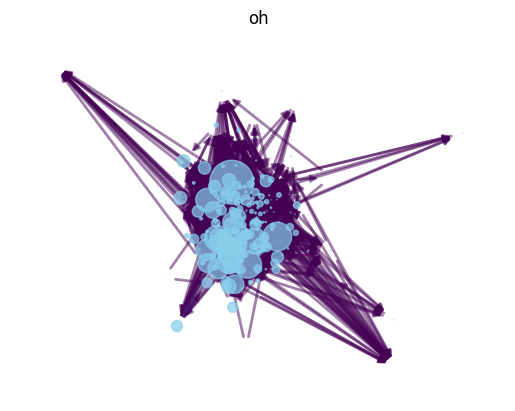

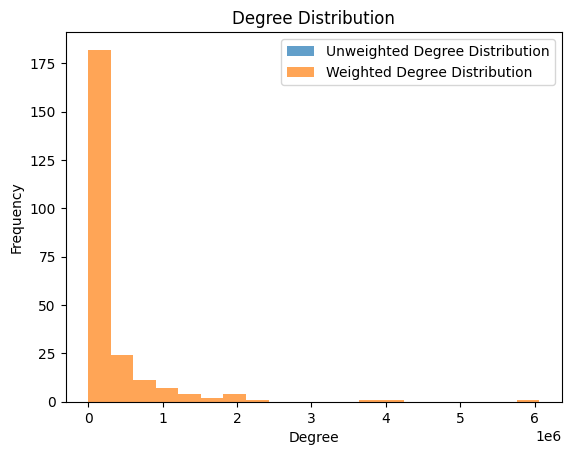

In [ ]:
import powerlaw




    # Calculate weighted degree for each node (sum of edge weights)
weighted_degrees = {node: sum(data['weight'] for _, data in G[node].items()) for node in G.nodes()}

    # Prepare the weighted degree sequence for analysis
weighted_degree_sequence = list(weighted_degrees.values())

    # analysise part
print("\nCentrality measures:")
print("Degree Centrality:", nx.degree_centrality(G))
print("Betweenness Centrality:", nx.betweenness_centrality(G))
print("Closeness Centrality:", nx.closeness_centrality(G))

print("\nClustering coefficient:", nx.average_clustering(G))


    # Step 4: Analyze community structure (if applicable)
# communities = list(nx.connected_components(G))
# print("\nNumber of communities:", len(communities))
# print("Communities:", communities)

# diameter = nx.diameter(G)
# print(f"Diameter of the graph: {diameter}")

    # Node with maximum degree (unweighted)
degrees = dict(G.degree())
max_degree_node = max(degrees, key=degrees.get)
print("Node with max degree without weights:", max_degree_node)

    # Step 3: Node with max degree with weights
weighted_degrees = dict(G.degree(weight='weight'))
max_weighted_degree_node = max(weighted_degrees, key=weighted_degrees.get)
print("Node with max degree with weights:", max_weighted_degree_node)

    # Evaluate if the graph follows a power-law or scale-free model
degree_sequence = [d for n, d in G.degree()]
fit = powerlaw.Fit(degree_sequence)
print(f"Power-law fit results: {fit.power_law.alpha}, {fit.power_law.xmin}")


    # Assortativity
assortativity = nx.degree_assortativity_coefficient(G)
print("Assortativity:", assortativity)

    # Average path length (unweighted)
# avg_path_length = nx.average_shortest_path_length(G)
# print("Average path length:", avg_path_length)


    # Largest connected component
# largest_cc = max(nx.connected_components(G), key=len)
# print("Size of largest connected component:", len(largest_cc))

#     # Check if the graph is an Erdős-Rényi random graph
# erdos_renyi = nx.fast_gnp_random_graph(len(G), nx.density(G))
# print("Is the graph an Erdős-Rényi random graph?", nx.is_isomorphic(G, erdos_renyi))

    # Evaluate if the graph follows a power-law or scale-free model (unweighted)
fit_unweighted = powerlaw.Fit(degree_sequence)
print(f"Power-law fit results (unweighted): {fit_unweighted.power_law.alpha}, {fit_unweighted.power_law.xmin}")

    # Evaluate if the graph follows a power-law or scale-free model (weighted)
fit_weighted = powerlaw.Fit(weighted_degree_sequence)
print(f"Power-law fit results (weighted): {fit_weighted.power_law.alpha}, {fit_weighted.power_law.xmin}")

    # Modularity Calculation


    # Robustness Assessment
# Remove nodes and calculate the number of connected components
# connected_components = [len(c) for c in nx.connected_components(G)]
# print("Robustness:", connected_components)

    # Centrality Measures
eigenvector_centrality = nx.eigenvector_centrality(G)
pagerank_centrality = nx.pagerank(G)
harmonic_centrality = nx.harmonic_centrality(G)
load_centrality = nx.load_centrality(G)

print("Eigenvector Centrality : ",eigenvector_centrality)
print("Pagerank Centrality : ", pagerank_centrality)
print("Harmonic Centrality : ", harmonic_centrality)
print("Load Centrality : ",load_centrality)

    # Community Detection
girvan_newman_communities = nx.algorithms.community.girvan_newman(G)
louvain_communities = nx.algorithms.community.greedy_modularity_communities(G)
# label_propagation_communities = nx.algorithms.community.label_propagation.label_propagation_communities(G)

print("Girvan Newmann Community : ", girvan_newman_communities)
print("Louvain Communities : ",louvain_communities)
# print("Label  Propagation Commmunities : ", label_propagation_communities)

    # Path Analysis
shortest_path_length = nx.shortest_path_length(G)
# avg_shortest_path_length = nx.average_shortest_path_length(G)
# eccentricity = nx.eccentricity(G)
closeness_centrality = nx.closeness_centrality(G)

    # Graph Partitioning
# kernighan_lin_partition = nx.algorithms.community.kernighan_lin_bisection(G)

    # Graph Connectivity
# connectivity = nx.is_connected(G)
# node_connectivity = nx.node_connectivity(G)
# edge_connectivity = nx.edge_connectivity(G)

    # Graph Clustering
clustering_coefficient = nx.average_clustering(G)
transitivity = nx.transitivity(G)

print(f"Shortest Path Length: {shortest_path_length}")
# print(f"Average Shortest Path Length: {avg_shortest_path_length}")
# print(f"Eccentricity: {eccentricity}")
print(f"Closeness Centrality: {closeness_centrality}")
# print(f"Kernighan-Lin Partition: {kernighan_lin_partition}")
# print(f"Connectivity: {connectivity}")
# print(f"Node Connectivity: {node_connectivity}")
# print(f"Edge Connectivity: {edge_connectivity}")
print(f"Clustering Coefficient: {clustering_coefficient}")
print(f"Transitivity: {transitivity}")



    # ploting part


    # Kamada-Kawai layout for positioning
pos = nx.kamada_kawai_layout(G)

    # Calculate weighted degree for each node (sum of edge weights)
weighted_degrees = {node: sum(d['weight'] for u, v, d in G.edges(node, data=True)) for node in G}

    # Normalize weighted degrees for node size scaling (optional scaling factor can be adjusted)
max_weighted_degree = max(weighted_degrees.values())
node_sizes = [1000 * (weighted_degrees[node] / max_weighted_degree) for node in G]

    # Edge weights for visibility (optional scaling factor can be adjusted)
edge_weights = [d['weight'] for u, v, d in G.edges(data=True)]
max_edge_weight = max(edge_weights)
edge_colors = [d['weight'] / max_edge_weight for u, v, d in G.edges(data=True)]

    # Draw the graph without node labels
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color='skyblue', alpha=0.7)
nx.draw_networkx_edges(G, pos, width=2, edge_color=edge_colors, alpha=0.5)

plt.title('oh')
plt.axis('off') # Hide the axes
plt.show()

    # Degree distribution (unweighted)
degrees = dict(G.degree())
degree_sequence = [d for n, d in degrees.items()]
plt.hist(degree_sequence, bins=20, alpha=0.7, label='Unweighted Degree Distribution')

    # Degree distribution (weighted)
weighted_degrees = dict(G.degree(weight='weight'))
weighted_degree_sequence = [d for n, d in weighted_degrees.items()]
plt.hist(weighted_degree_sequence, bins=20, alpha=0.7, label='Weighted Degree Distribution')

plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("Frequency")
plt.legend()
plt.show()


